In [1]:
#import freud, mdtraj
#import MDAnalysis as mda
import numpy as np
from scipy.spatial import cKDTree, Voronoi, voronoi_plot_2d
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import networkx as nx
from matplotlib.collections import LineCollection

a = 1.42
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern"],
    "font.size": 14,
    "axes.labelsize": 14,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "legend.fontsize": 12,
})

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)

In [5]:
def find_dynamic_cutoff(positions, factor=1.2):
    """
    Median C–C bond × factor safe search radius.

    """
    dists, _ = cKDTree(positions).query(positions, k=4)  # 0=self, 1-3=real bonds
    bond_len = np.median(dists[:, 3])                    # third neighbour = C–C
    return factor * bond_len

def NN(positions, _dummy=None):
    tree = cKDTree(positions)
    R = find_dynamic_cutoff(positions)

    # 2) ball query
    raw = tree.query_ball_point(positions, r=R)

    N = len(positions)
    neigh = [None]*N
    for i, cand in enumerate(raw):
        # compute distances to the candidates
        ds = np.linalg.norm(positions[cand] - positions[i], axis=1)
        # pair and sort, dropping self if present
        pairs = sorted(zip(cand, ds), key=lambda x: x[1])
        # drop the self‐distance of zero if it sneaks in
        pairs = [p for p in pairs if p[0]!=i]
        # take at most 3 true nearest
        picks = [p[0] for p in pairs[:3]]
        neigh[i] = set(picks)

    # 4) symmetrize
    for i, nbrs in enumerate(neigh):
        for j in list(nbrs):
            neigh[j].add(i)

    return [list(s) for s in neigh]


def theta_ij(xi, yi, xj, yj):
    dx = xj - xi
    dy = yj - yi
    return np.arctan2(dy,dx)

def find_rings(adjacency, max_cycle_size=8):
    """
    Find all simple cycles (rings) in an undirected graph represented by an adjacency list.
    Returns a set of frozensets, each representing a ring (order is disregarded).
    """
    N = len(adjacency)
    found_rings = set()

    def dfs(start, current_path, visited_set):
        if len(current_path) > max_cycle_size:
            return
        current = current_path[-1]
        for nbr in adjacency[current]:
            if nbr == start and len(current_path) >= 3:
                ring = frozenset(current_path)
                found_rings.add(ring)
            elif nbr not in visited_set:
                dfs(start, current_path + [nbr], visited_set | {nbr})

    for i in range(N):
        dfs(i, [i], {i})
    return found_rings

def reorder_ring(ring_nodes, positions, adjacency):
    ring_nodes = set(ring_nodes)
    # adjacency restricted to this ring
    sub_adj = {i: [j for j in adjacency[i] if j in ring_nodes] for i in ring_nodes}

    start  = next(iter(ring_nodes))
    order  = [start]
    prev   = None
    cur    = start

    for _ in range(len(ring_nodes) - 1):
        nxt = [j for j in sub_adj[cur] if j != prev and j not in order]
        if not nxt:                          
            cen = positions[list(ring_nodes)].mean(axis=0)
            return sorted(ring_nodes,
                          key=lambda i: np.arctan2(positions[i,1]-cen[1],
                                                   positions[i,0]-cen[0]))
        prev, cur = cur, nxt[0]
        order.append(cur)

    return order

def plot_lattice(positions, random_atom, random_index,
                 neighbor_list, neighbor_indices,
                 zoom, atom_numbers, fname="picture", inset_chunk_size=10.0):

    N = len(positions)
    edges = [(i, j) for i in range(N) for j in neighbor_list[i] if j > i]

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(positions[:, 0], positions[:, 1], s=10, c='k', alpha=0.5)
    ax.set_xlabel(r'$x$ (Å)',fontsize=24); ax.set_ylabel(r'$y$ (Å)',fontsize=24); ax.axis('equal')

    # draw every bond once
    segs = [(positions[i], positions[j]) for i, j in edges]
    ax.add_collection(LineCollection(segs, colors='blue', linewidths=1.25, zorder=1))
    ax.set_xlim(0, max(positions[:,0]))
    ax.set_ylim(0, max(positions[:,1]))

    # highlight non-hexagonal rings only
    for ring in find_rings(neighbor_list, max_cycle_size=8):
        if len(ring) == 6:
            continue                                           # skip perfect hexagons
        ordered = reorder_ring(ring, positions, neighbor_list)
        coords  = positions[ordered + [ordered[0]]]
        col, lw = ('red', 1.5) if len(ring) in (5, 7, 8) else ('orange', 1)
        ax.plot(coords[:, 0], coords[:, 1], '-', color=col, linewidth=lw, zorder=3)

   
    if zoom:
        x0, y0 = random_atom
        ax.scatter(x0, y0, color='red', s=100, zorder=5)
        from mpl_toolkits.axes_grid1.inset_locator import inset_axes
        ax_ins = inset_axes(ax, width="33%", height="33%",loc='upper right',borderpad=1)
        half = 0.5 * inset_chunk_size
        mask = ((np.abs(positions[:, 0] - x0) <= half) &
                (np.abs(positions[:, 1] - y0) <= half))
        pts = positions[mask]

        ax_ins.scatter(pts[:, 0], pts[:, 1],
                       s=20, color='k', alpha=0.8,
                       zorder=2, clip_on=False)

        for i, j in edges:
            if mask[i] or mask[j]:
                xi, yi = positions[i]
                xj, yj = positions[j]
                ax_ins.plot([xi, xj], [yi, yj],
                            'k-', lw=1.5, zorder=1)

        ax_ins.scatter([x0], [y0],
                       color='red', s=120, zorder=5, clip_on=False)
        nb = positions[neighbor_indices]
        ax_ins.scatter(nb[:, 0], nb[:, 1],
                       color='blue', s=80, zorder=5, clip_on=False)

        angles = []
        for j in neighbor_indices:
            xj, yj = positions[j]
            theta = theta_ij(x0, y0, xj, yj)
            angles.append(theta)
            ax_ins.plot([x0, xj], [y0, yj],
                        'k--', lw=1, zorder=3)

        ax_ins.set_xlim(x0 - half, x0 + half)
        ax_ins.set_ylim(y0 - half, y0 + half)
        ax_ins.set_aspect('equal', 'box')
        ax_ins.margins(0.02)
        ax_ins.set_xticks([])
        ax_ins.set_yticks([])

    plt.savefig(f'../output/structures/{fname}.png', bbox_inches='tight', dpi=200)
    plt.show()

### Example of a defect structure from our simulations.

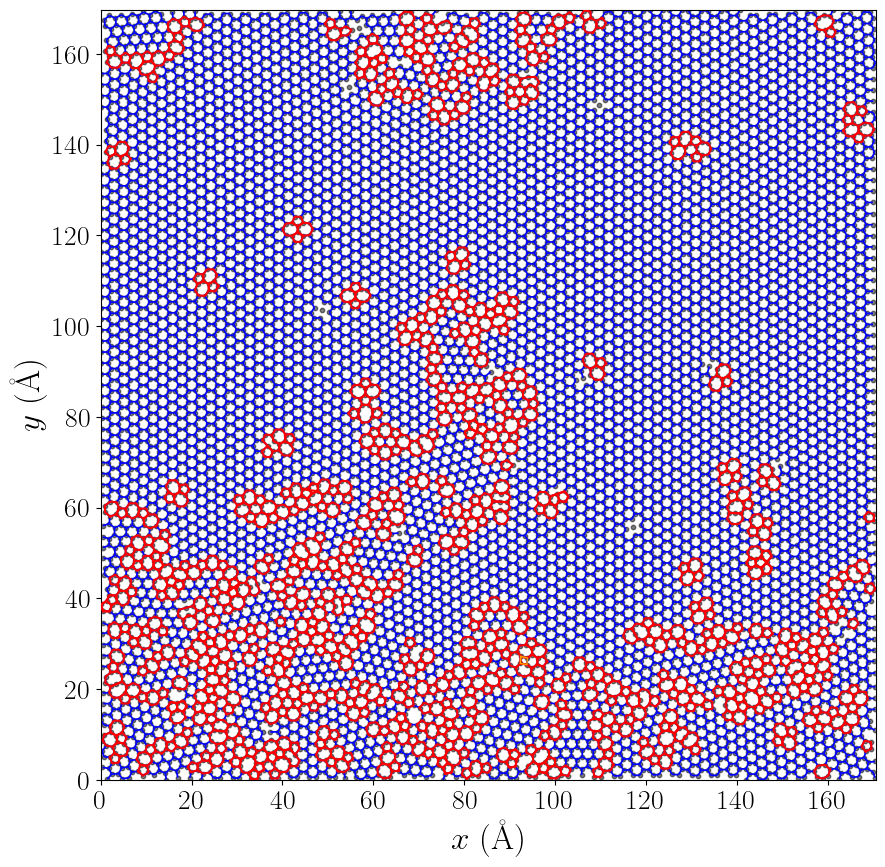

In [6]:
T = 9750
a = 1.42
data = np.loadtxt(f"../output/GAMMAS/{T}/min_{T}K.data",skiprows=15)
pos = data[:,2:4] 
atom_numbers = data[:, 0].astype(int)
neighs = NN(pos)
idx = 200 
plot_lattice(pos, pos[idx], idx, neighs, neighs[idx],False, atom_numbers, fname =f"anneal_{T}")

In [ ]:
all_rings = find_rings(neighs, max_cycle_size=8)
non_hex_rings = [ring for ring in all_rings if len(ring) != 6]
defect_atoms = set().union(*non_hex_rings)
defect_adjacency = {
    i: set(neighs[i]).intersection(defect_atoms)
    for i in defect_atoms
}

visited = set()
clusters = []

for atom in defect_atoms:
    if atom not in visited:
        stack = [atom]
        this_cluster = set()
        while stack:
            curr = stack.pop()
            if curr in visited:
                continue
            visited.add(curr)
            this_cluster.add(curr)
            # push any defect‐neighbor that hasn’t been visited
            for nbr in defect_adjacency[curr]:
                if nbr not in visited:
                    stack.append(nbr)
        clusters.append(this_cluster)

# 5) Print out each cluster’s atom‐indices
for c_idx, comp in enumerate(clusters):
    sorted_indices = sorted(comp)
    print(f"Cluster #{c_idx:2d}: {sorted_indices}")


# Crystal

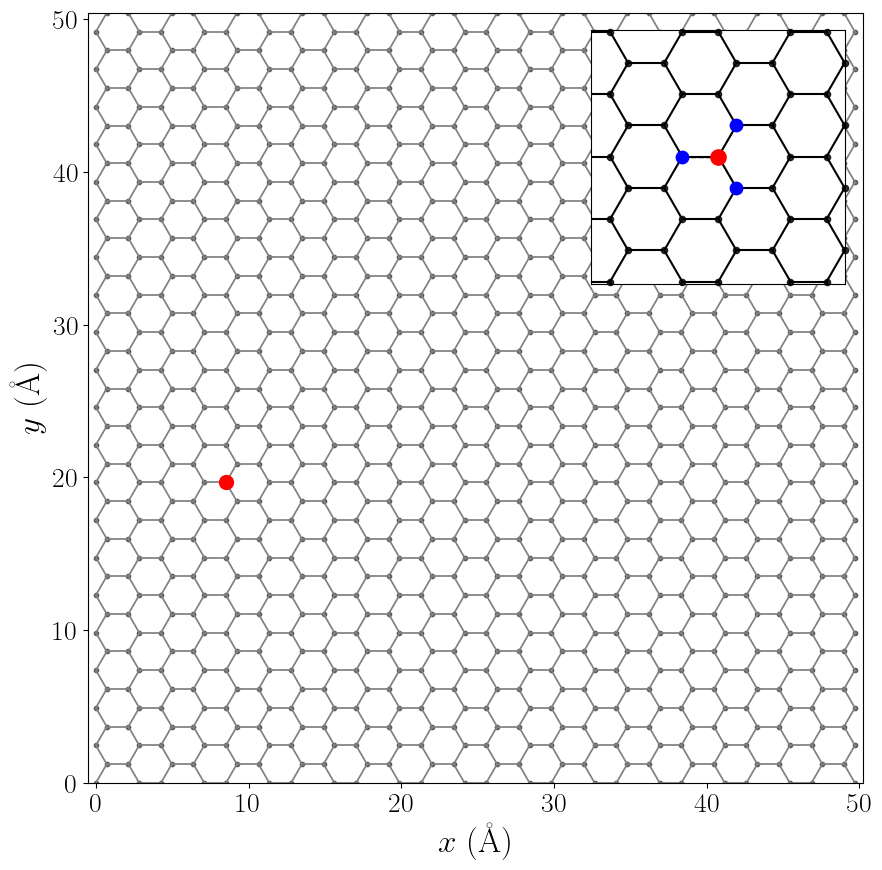

In [ ]:
T = 300
a = 1.42
data = np.loadtxt(f"data/crystal.txt")
pos = data[:,2:4] 
atom_numbers = data[:, 0].astype(int)
neighs = NN(pos)
idx = 200# plot atom number 200 in inset plot
plot_lattice(pos, pos[idx], idx, neighs, neighs[idx], True, atom_numbers, fname =f"anneal_{T}")

# Voronoi diagram of crystal

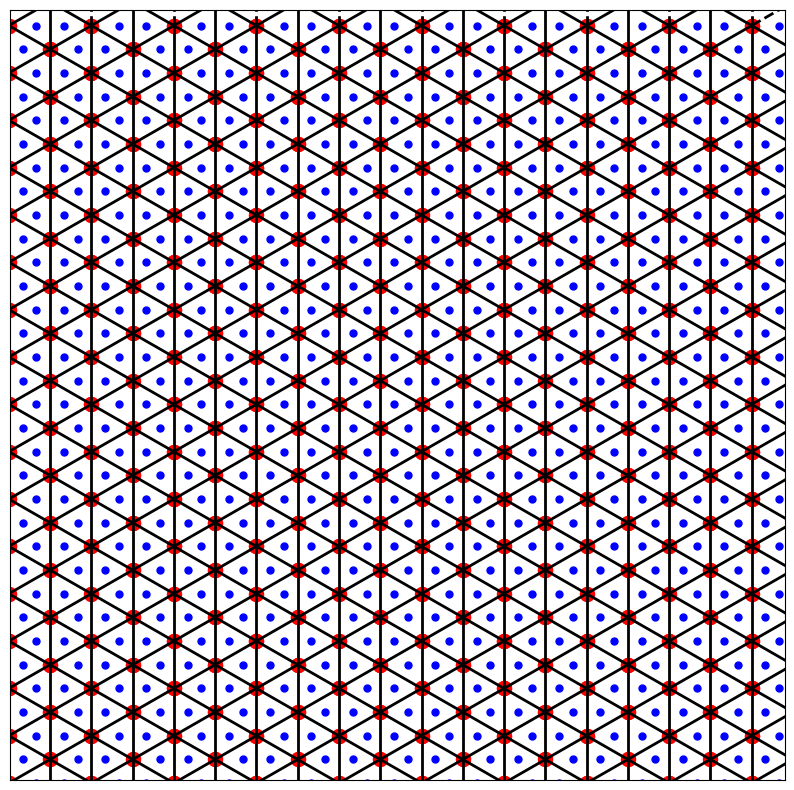

In [2]:
T = 300

data = np.loadtxt(f"data/crystal.txt",skiprows=15)
pos = data[:,2:4]
vor = Voronoi(pos)
fig, ax = plt.subplots(figsize=(10,10))
voronoi_plot_2d(vor, ax=ax, show_vertices=True, line_colors='k', line_width=2, point_size=10)
plt.xticks([])
plt.yticks([])
plt.xlim(10,50)
plt.ylim(10,50)
plt.savefig(f"../output/crystal_voronoi.png",dpi=400)

# Static structure factor

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LogNorm

a = 1.42
T_list = [
    ('../output/GAMMAS/8700/min_8700K.data',  "0.598"),
    ('../output/GAMMAS/9769/min_9769K.data',  "2.301"),
    ('../output/GAMMAS/9750/min_9750K.data',  "3.655"),
    ('../output/GAMMAS/10350/min_10350K.data',"4.746")
]
nbin = 1028

Sk_maps, extents = [], []

for fname, Gamma in T_list:
    # Load positions (in Å)
    pos = np.loadtxt(fname, skiprows=15)[:, 2:4]
    N   = pos.shape[0]

    #uild occupancy grid (counts per pixel)
    Lx, Ly = np.ptp(pos[:, 0]), np.ptp(pos[:, 1])
    ix = np.floor((pos[:, 0] - pos[:, 0].min()) / Lx * nbin).astype(int) % nbin
    iy = np.floor((pos[:, 1] - pos[:, 1].min()) / Ly * nbin).astype(int) % nbin

    occ = np.zeros((nbin, nbin), dtype=int)
    np.add.at(occ, (iy, ix), 1)
    mean_occ = N / (nbin**2)
    dA = (Lx / nbin) * (Ly / nbin)            # area of one pixel
    delta_rho = occ*dA         

    #  FFT raw 2D power spectrum
    Rk = np.fft.fft2(delta_rho)
    Sk2d = np.fft.fftshift(np.abs(Rk)**2) / N  #
    Sk2d = gaussian_filter(Sk2d, sigma=0.8)

    # Build k‐axes (in units of 1/a)
    kx = np.fft.fftshift(np.fft.fftfreq(nbin, d=Lx/nbin)) * 2 * np.pi
    ky = np.fft.fftshift(np.fft.fftfreq(nbin, d=Ly/nbin)) * 2 * np.pi
    extents.append((kx[0], kx[-1], ky[0], ky[-1]))
    Sk_maps.append(Sk2d)


vmin = 2e-4
vmax = max(m.max() for m in Sk_maps)

fig, axes = plt.subplots(2, 2, figsize=(10, 10), dpi=800,
                         constrained_layout=True, sharey=True)

for ax, Sk2d, ext, (_, Gamma) in zip(axes.flat, Sk_maps, extents, T_list):
    im = ax.imshow(
        Sk2d,
        extent=ext,
        origin='lower',
        norm=LogNorm(vmin=vmin, vmax=vmax),
        cmap='viridis'
    )
    ax.set_title(rf'$\Gamma = {Gamma}$', fontsize=24)
    ax.set_xlabel(r'$k_x\;(a^{-1})$', fontsize=20)
    ax.set_ylabel(r'$k_y\;(a^{-1})$', fontsize=20)
    ax.set_xlim(-10,10)
    ax.set_ylim(-10,10)

# Shared colorbar
import matplotlib.ticker as mticker

cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8)
cbar.set_label(r'$S(\mathbf{k})$', fontsize=22)

plt.savefig("../output/structure_factor.png", dpi=800)
plt.show()


# Radial distribution function

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from rdfpy import rdf

T_crystal = 8700
T_hexatic = 9769
T_liquid = 10800

# List of temperatures and their corresponding dr values
temps = [(T_crystal, r'$\Gamma = 0.598$, Crystalline', 2), 
         (T_hexatic, r'$\Gamma = 2.301$ Hexatic',2), 
         (T_liquid, r'$\Gamma = 4.910$ Liquid',2)]

drs   = { T_crystal: 0.05, 
          T_hexatic: 0.05,
          T_liquid: 0.05}

colors = {T_crystal: 'blue', T_hexatic: 'lime', T_liquid: 'red'}

plt.figure(figsize=(16, 10), dpi=1200)

n = -2
for T, G, lw, in temps:
    n+=2
    data = np.loadtxt(f"../output/GAMMAS/{T}/anneal_{T}K.data",skiprows=15)
    pos  = data[:, 2:4]
    noise = np.random.normal(loc=0.0, scale=0.1, size=pos.shape)
    coords = pos + noise
    g_r, radii = rdf(coords, dr=drs[T])
    g_smooth  = gaussian_filter1d(g_r, sigma=1.5)
    plt.semilogx(radii, g_smooth+n, color=colors[T], label=G, lw = lw)

x_ticks = [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80]
plt.xticks(x_ticks, [str(t) for t in x_ticks], fontsize=14)
plt.yticks([])
plt.axhline(1, color='k', linestyle='--', label='Uncorrelated')
plt.axhline(3, color='k', linestyle='--')
plt.axhline(5, color='k', linestyle='--')

plt.xlim(0.5, 80)
plt.xlabel(r'Graphene pair distance (Å)', fontsize=30)
plt.ylabel(r'Radial distribution function',   fontsize=30)
plt.legend(fontsize=20, loc="upper right")

plt.tight_layout()
plt.savefig("rdf_comparison.png",dpi=600)
plt.show()


# Ring statistics

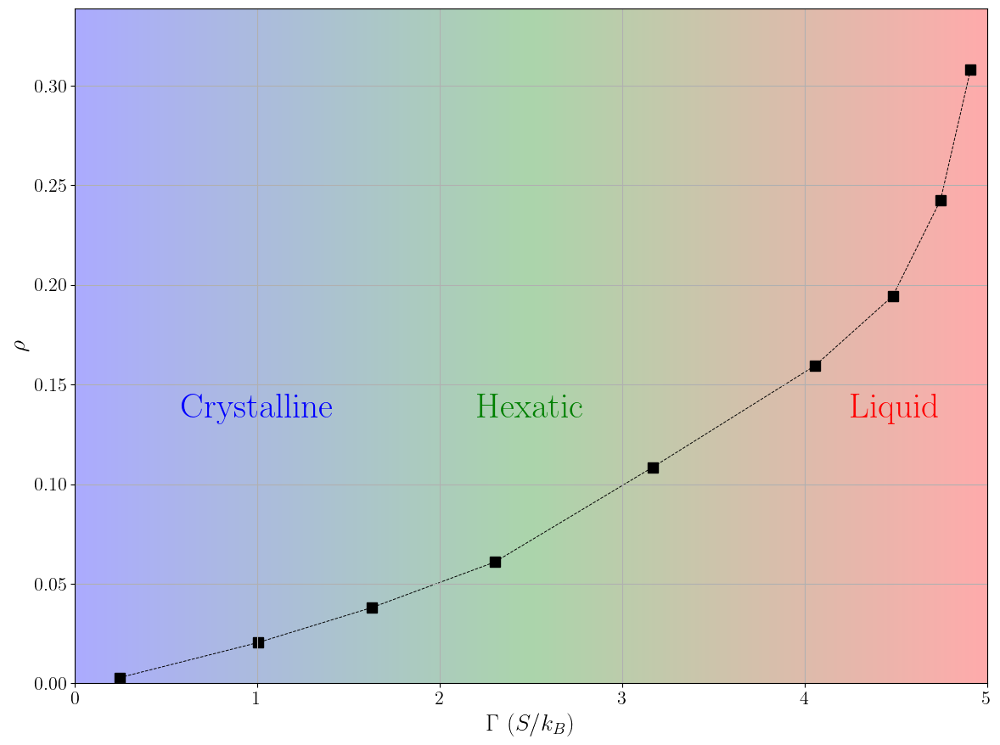

In [ ]:
def compute_ring_stats(positions):
    adj = NN(positions)
    raw = find_rings(adj)
    ordered = [reorder_ring(r, positions, adj) for r in raw]
    rings_by_size = {}
    for r in ordered:
        rings_by_size.setdefault(len(r), []).append(r)
    n5 = len(rings_by_size.get(5, []))
    n7 = len(rings_by_size.get(7, []))
    n8 = len(rings_by_size.get(8, []))
    sw = set()
    for r5 in rings_by_size.get(5, []):
        for r7 in rings_by_size.get(7, []):
            common = set(r5) & set(r7)
            if len(common) == 2 and list(common)[1] in adj[list(common)[0]]:
                sw.add(frozenset((frozenset(r5), frozenset(r7))))
    n_sw = len(sw)
    return n5, n7, n8, n_sw

# Main analysis 
a = 1.42
from matplotlib.colors import LinearSegmentedColormap

# Load entropy vs temperature
entropy_data = np.loadtxt('data/S.txt')
Ts = entropy_data[:,0].astype(int)
entropies = np.sort(entropy_data[:,1])

# Compute total defects for each temperature
defect_counts = []
for T in Ts:
    data = np.loadtxt(f"../output/GAMMAS/{T}/anneal_{T}K.data", skiprows=15)
    pos = data[:,2:4]
    n5, n7, n8, n_sw = compute_ring_stats(pos)
    total_defects = (n5 + n7 + n8 + n_sw) / 11040
    defect_counts.append(total_defects)

fig, ax = plt.subplots(figsize=(12,9))

# Get your x/y bounds
xmin, xmax = 0, 5
ymin, ymax = 0, max(defect_counts)*1.1

# Build a small image whose columns go from 0 to 1
gradient = np.linspace(0, 1, 1000)  
gradient = np.vstack((gradient, gradient))

# 3) Make a colormap that passes through Blue→Green→Red
cmap = LinearSegmentedColormap.from_list("phase_grad",
                                         ["blue", "green", "red"])

# 4) Paint it on the full axes
ax.imshow(gradient,
          aspect="auto",
          cmap=cmap,
          extent=[xmin, xmax, ymin, ymax],
          origin="lower",
          alpha=0.33,
          zorder=0)

ax.plot(entropies, defect_counts, "s--", c="k", lw=0.7, zorder=1, markersize=8)

x_mid = lambda a,b: 0.5*(a+b)
ax.text(x_mid(xmin, 2), 1.2*ymax, "Crystalline",
        ha="center", va="center",
        transform=ax.get_xaxis_transform(),
        fontsize=30, color="blue", zorder=2)
ax.text(x_mid(2, 3), 1.2*ymax, "Hexatic",
        ha="center", va="center",
        transform=ax.get_xaxis_transform(),
        fontsize=30, color="green", zorder=2)
ax.text(x_mid(4, 5), 1.2*ymax, "Liquid",
        ha="center", va="center",
        transform=ax.get_xaxis_transform(),
        fontsize=30, color="red", zorder=2)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_xlabel(r'$\Gamma \,\, (S/k_{B})$', fontsize=20)
ax.set_ylabel(r'$\rho$', fontsize=20)
ax.grid(True)
plt.tight_layout()
plt.savefig("../output/defect_density.png", dpi=200)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree


def get_defect_clusters(positions, R_cluster_factor=1.5):

    # 1) find all rings up to size 8
    adj       = NN(positions)
    raw_rings = find_rings(adj, max_cycle_size=8)
    ordered   = [reorder_ring(r, positions, adj) for r in raw_rings]

    # 2) pick out defect rings (≠6 members) and flatten to atom‐index set
    defect_atoms = sorted({i for r in ordered if len(r)!=6 for i in r})
    defect_pos   = positions[defect_atoms]

    # 3) build a proximity graph among defect atoms
    bond_len     = np.median(cKDTree(positions).query(positions, k=4)[0][:,3])
    R_cluster    = R_cluster_factor * bond_len
    tree         = cKDTree(defect_pos)
    pairs        = tree.query_pairs(R_cluster)

    # adjacency for defect‐array indices
    cluster_adj = {i:set() for i in range(len(defect_pos))}
    for i,j in pairs:
        cluster_adj[i].add(j)
        cluster_adj[j].add(i)

    # 4) find connected components
    visited = set()
    clusters = []
    for i in range(len(defect_pos)):
        if i not in visited:
            stack, comp = [i], []
            while stack:
                u = stack.pop()
                if u in visited: 
                    continue
                visited.add(u)
                comp.append(u)
                stack.extend(cluster_adj[u] - visited)
            clusters.append(comp)

    return defect_pos, clusters

from matplotlib.colors import Normalize

def plot_defect_clusters_density(ax, positions, defect_pos, clusters,
                                  norm, cmap, marker_size=5):
    # background atoms
    ax.scatter(positions[:,0], positions[:,1],
               s=2, color='black', alpha=0.6)
    
    total_def = len(defect_pos)
    for comp in clusters:
        density = len(comp) / total_def
        pts   = defect_pos[comp]
        ax.scatter(pts[:,0], pts[:,1],
                   s=marker_size,
                   color=cmap(norm(density)),
                   marker='o')
    
    ax.set_aspect('equal')
    ax.set_xticks([]); ax.set_yticks([])


temps = [9400, 9690, 9750, 10020]
fig, axes = plt.subplots(2, 2, figsize=(10,10), tight_layout=True)

norm = Normalize(vmin=0, vmax=1)
cmap = plt.cm.get_cmap('YlOrRd')

for ax, T in zip(axes.flat, temps):
    a    = 1.42
    data = np.loadtxt(f"../output/GAMMAS/{T}/anneal_{T}K.data", skiprows=15)
    pos  = data[:,2:4] / a
    
    # get defects
    defect_pos, clusters = get_defect_clusters(pos, R_cluster_factor=1.5)
    
    # plot with common norm/cmap
    plot_defect_clusters_density(ax, pos, defect_pos, clusters, norm, cmap)

# add one colorbar for all
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes.ravel().tolist(),
                    fraction=0.046, pad=0.1)
cbar.set_label('Cluster size density\n(frac. of defect atoms)')

plt.show()

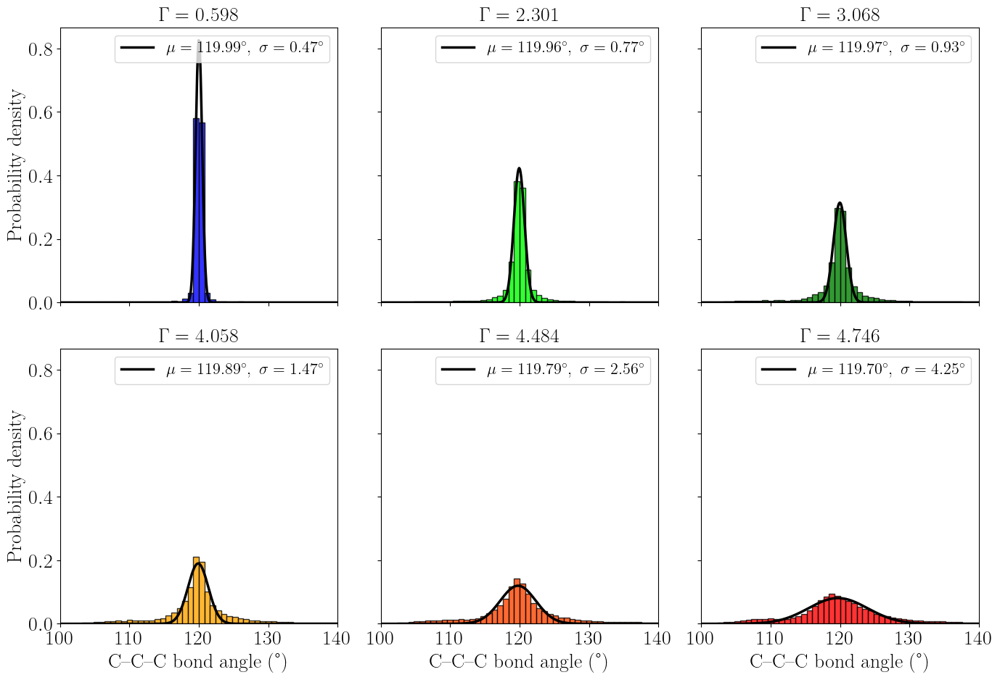

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.optimize import curve_fit

def compute_all_bond_angles(positions, adjacency):
    """
    Compute the angle (in degrees) for every C-C-C- triplet in the graph.
    """
    def angle_at_center(pi, pj, pk):
        v1 = pj - pi
        v2 = pk - pi
        cosθ = np.dot(v1, v2) / (np.linalg.norm(v1)*np.linalg.norm(v2))
        cosθ = np.clip(cosθ, -1.0, 1.0)
        return np.degrees(np.arccos(cosθ))

    angles = []
    for i, nbrs in enumerate(adjacency):
        for j, k in combinations(nbrs, 2):
            θ = angle_at_center(positions[i], positions[j], positions[k])
            angles.append(θ)
    return np.array(angles)

def gaussian(x, A, mu, sigma):
    """
    Single‐Gaussian function. Returns A * exp[-(x-mu)^2 / (2 sigma^2)].
    """
    return A * np.exp(-0.5 * ((x - mu) / sigma)**2)


Ts = [
    (8700, "0.598", "blue"),
    (9769, "2.301", "lime"),
    (9785, "3.068", "green"),
    (9900, "4.058", "orange"),
    (10020, "4.484", "orangered"),
    (11000, "4.746", "red"),
]

fig, axes = plt.subplots(2, 3, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (T, G, c) in zip(axes, Ts):

    data = np.loadtxt(f"../output/GAMMAS/{T}/min_{T}K.data", skiprows=15)
    positions = data[:, 2:4]


    adj = NN(positions)
    angles = compute_all_bond_angles(positions, adj)

    nbins = 50
    bin_range = (100, 140)        
    hist, bin_edges = np.histogram(
        angles,
        bins=nbins,
        range=bin_range,
        density=True             
    )
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    A0 = np.max(hist)
    mu0 = np.mean(angles)
    sigma0 = np.std(angles)
    p0 = [A0, mu0, sigma0]

    try:
        popt, pcov = curve_fit(
            gaussian,
            bin_centers,
            hist,
            p0=p0,
            bounds=(
                [0.0, 100.0, 0.1],   # lower bounds for A, mu, sigma
                [np.inf, 140.0, 10.0]  # upper bounds
            )
        )
        A_fit, mu_fit, sigma_fit = popt
    except RuntimeError:
        A_fit, mu_fit, sigma_fit = p0

    ax.hist(
        angles,
        bins=nbins,
        range=bin_range,
        density=True,
        edgecolor='k',
        alpha=0.8,
        color=c
    )

    x_fit = np.linspace(bin_range[0], bin_range[1], 400)
    y_fit = gaussian(x_fit, A_fit, mu_fit, sigma_fit)
    ax.plot(x_fit, y_fit, c='k', linewidth=2.5, label=(rf"$\mu={mu_fit:.2f}^\circ,\ \sigma={sigma_fit:.2f}^\circ$"))

    ax.set_xlim(bin_range)
    ax.set_title(rf"$\Gamma = {G}$", fontsize=20)
    ax.legend(fontsize=16, loc='upper right')

# Label the common x‐axis & y‐axis
for ax in axes[-3:]:
    ax.set_xlabel(r"C-C-C bond angle (°)", fontsize=20)
axes[0].set_ylabel("Probability density", fontsize=20)
axes[3].set_ylabel("Probability density", fontsize=20)


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("../output/bond_angle_dist.png", dpi=600)
plt.show()


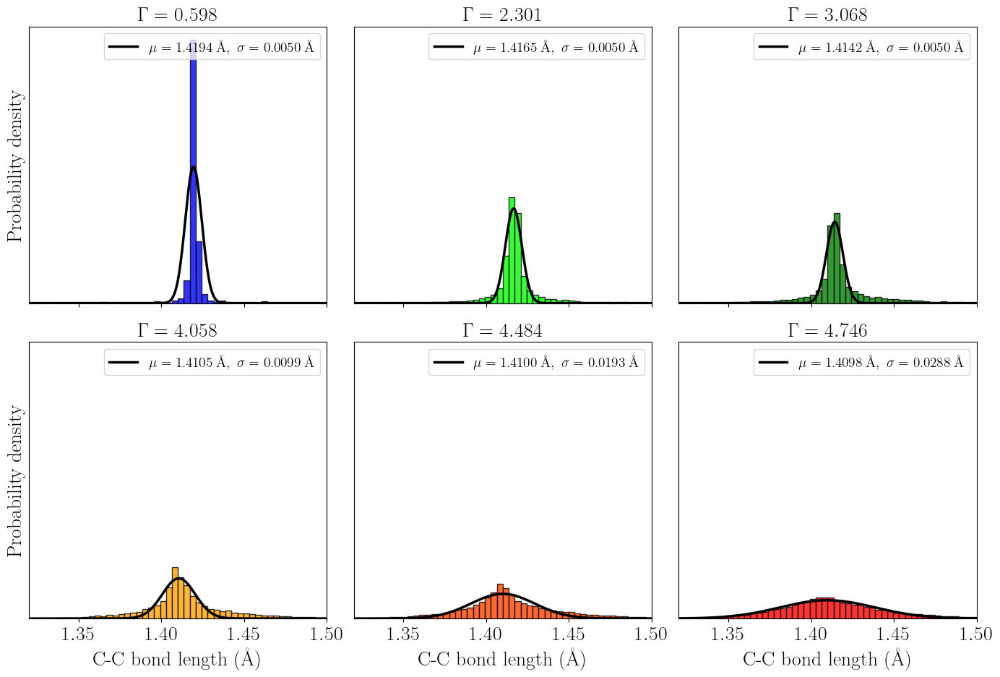

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.optimize import curve_fit

def compute_all_bond_lengths(positions, adjacency):
    """
    Compute the length (in Å) for every C–C bond in the graph,
    avoiding double‐counting. Returns a 1D array of all bond lengths.
    """
    lengths = []
    for i, nbrs in enumerate(adjacency):
        for j in nbrs:
            if j > i:  # ensure each bond is counted only once
                rij = positions[j] - positions[i]
                dist = np.linalg.norm(rij)
                lengths.append(dist)
    return np.array(lengths)

def gaussian(x, A, mu, sigma):
    """
    Single‐Gaussian function: A * exp[-(x - mu)^2 / (2 sigma^2)].
    """
    return A * np.exp(-0.5 * ((x - mu) / sigma)**2)

Ts = [
    (8700, "0.598", "blue"),
    (9769, "2.301", "lime"),
    (9785, "3.068", "green"),
    (9900, "4.058", "orange"),
    (10020, "4.484", "orangered"),
    (11000, "4.746", "red"),
]

fig, axes = plt.subplots(2, 3, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (T, G, c) in zip(axes, Ts):

    data = np.loadtxt(f"../output/GAMMAS/{T}/min_{T}K.data", skiprows=15)
    positions = data[:, 2:4]  # shape = (N, 2) or (N, 3) if 3D
    
    adj = NN(positions)

    bond_lengths = compute_all_bond_lengths(positions, adj)

    nbins = 50
    bin_range = (1.32, 1.5)
    
    hist, bin_edges = np.histogram(
        bond_lengths,
        bins=nbins,
        range=bin_range,
        density=True,
    )
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    

    A0     = np.max(hist)
    mu0    = np.mean(bond_lengths)
    sigma0 = np.std(bond_lengths)
    p0 = [A0, mu0, sigma0]
    

    try:
        popt, pcov = curve_fit(
            gaussian,
            bin_centers,
            hist,
            p0=p0,
            bounds=(
                [    0.0, 1.2, 0.005],   # lower bounds for A, µ, σ
                [np.inf, 1.6,  0.1  ]    # upper bounds for A, µ, σ
            )
        )
        A_fit, mu_fit, sigma_fit = popt
    except RuntimeError:
        # if fit fails, just revert to initial guesses
        A_fit, mu_fit, sigma_fit = p0
    

    ax.hist(
        bond_lengths,
        bins=nbins,
        range=bin_range,
        density=True,
        edgecolor='k',
        alpha=0.8,
        color=c
    )
    

    x_fit = np.linspace(bin_range[0], bin_range[1], 400)
    y_fit = gaussian(x_fit, A_fit, mu_fit, sigma_fit)
    ax.plot(
        x_fit,
        y_fit,
        c='k',
        linewidth=2.5,
        label=(rf"$\mu={mu_fit:.4f}\,\mathrm{{\AA}},\ \sigma={sigma_fit:.4f}\,\mathrm{{\AA}}$")
    )
    

    ax.set_xlim(bin_range)
    ax.set_title(rf"$\Gamma = {G}$", fontsize=20)
    ax.legend(fontsize=14, loc='upper right')
    ax.set_yticks([])


for ax in axes[-3:]:
    ax.set_xlabel("C-C bond length (Å)", fontsize=20)
axes[0].set_ylabel("Probability density", fontsize=20)
axes[3].set_ylabel("Probability density", fontsize=20)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("../output/bond_length_dist.png", dpi=600)
plt.show()

In [169]:
import numpy as np
from scipy.spatial import cKDTree

def find_dynamic_cutoff(positions, factor=1.2):
    """
    Compute a “safe” neighbor‐radius by taking the median C–C bond (third neighbor)
    and multiplying by `factor` (default 1.2).
    """
    dists, _ = cKDTree(positions).query(positions, k=4)  # 0=self, 1–3 = real bonds
    bond_len = np.median(dists[:, 3])                    # third neighbor = C–C
    return factor * bond_len

def NN(positions, _dummy=None):
    """
    Build a nearest‐neighbor adjacency list for “graphene‐like” coordinates.
    Returns a Python list-of‐lists, `neighbors`, where neighbors[i] is a list of
    atom‐indices that are (symmetrically) nearest neighbors of atom i.
    """
    tree = cKDTree(positions)
    R = find_dynamic_cutoff(positions)

    # 1) ball‐query: for each point i, find all candidates within radius R
    raw = tree.query_ball_point(positions, r=R)

    N = len(positions)
    neigh = [None] * N

    for i, cand in enumerate(raw):
        # compute actual distances to all candidates
        ds = np.linalg.norm(positions[cand] - positions[i], axis=1)
        # pair (index, distance) and sort by distance
        pairs = sorted(zip(cand, ds), key=lambda x: x[1])
        # drop self if it sneaks in (distance = 0)
        pairs = [p for p in pairs if p[0] != i]
        # take the three smallest‐distance neighbors (graphene has 3)
        picks = [p[0] for p in pairs[:3]]
        neigh[i] = set(picks)

    # 2) Symmetrize: if j is in neigh[i], also add i to neigh[j].
    for i, nbrs in enumerate(neigh):
        for j in list(nbrs):
            neigh[j].add(i)

    # Convert each set to a list before returning
    return [list(s) for s in neigh]

def find_rings(adjacency, max_cycle_size=8):
    """
    Find all simple (non‐repeating) cycles up to length `max_cycle_size` in an undirected graph.
    - `adjacency` should be a list‐of‐lists, where adjacency[i] is a list of neighbors of node i.
    - We do a DFS from each start node i, building paths until we either:
        • return to `start` with length ≥ 3 (found a ring), or
        • exceed `max_cycle_size`.
    Returns a `set` of `frozenset(...)`, each frozenset being the *set* of node-indices in that ring.
    """
    N = len(adjacency)
    found_rings = set()

    def dfs(start, current_path, visited_set):
        if len(current_path) > max_cycle_size:
            return
        current = current_path[-1]
        for nbr in adjacency[current]:
            if nbr == start and len(current_path) >= 3:
                # Found a simple cycle: stash its node‐set as a canonical frozenset
                ring = frozenset(current_path)
                found_rings.add(ring)
            elif nbr not in visited_set:
                dfs(start, current_path + [nbr], visited_set | {nbr})

    for i in range(N):
        dfs(i, [i], {i})
    return found_rings

def count_dislocations(positions):
    # 1) Build adjacency (nearest‐neighbor) list
    adjacency = NN(positions)

    # 2) Find all simple cycles up to length 8
    all_rings = find_rings(adjacency, max_cycle_size=8)

    # 3) Filter the 5‐member and 7‐member rings
    rings5 = [set(r) for r in all_rings if len(r) == 5]
    rings7 = [set(r) for r in all_rings if len(r) == 7]

    n5_rings = len(rings5)
    n7_rings = len(rings7)

    # 4) Count 5–7 dislocation pairs: 
    #    A “dislocation” = one 5‐ring sharing exactly two atoms with one 7‐ring.
    used_5 = set()   # indices in rings5 that are already matched
    used_7 = set()   # indices in rings7 that are already matched
    n_dislocations = 0

    for i5, r5 in enumerate(rings5):
        if i5 in used_5:
            continue
        for i7, r7 in enumerate(rings7):
            if i7 in used_7:
                continue
            # If they share exactly two nodes, that means they share one bond
            shared = r5.intersection(r7)
            if len(shared) == 2:
                n_dislocations += 1
                used_5.add(i5)
                used_7.add(i7)
                break
        # once this 5‐ring is paired, stop looking for more 7‐rings for it
    return n5_rings, n7_rings, n_dislocations


In [195]:
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull

import numpy as np
from scipy.spatial import cKDTree

def estimate_radius(pos):
    tree = cKDTree(pos)
    dists, _ = tree.query(pos, k=2)
    nn_distances = dists[:, 1]
    return 0.5 * np.median(nn_distances)

def packing_fraction(pos):
    # 1) Find R_eff from median first‐NN distance
    R_eff = estimate_radius(pos)
    A_disk = np.pi * R_eff**2

    # 2) Find box dimensions (assume pos is unwrapped onto a single PBC tile)
    Lx = pos[:,0].max() - pos[:,0].min()
    Ly = pos[:,1].max() - pos[:,1].min()
    A_box = Lx * Ly

    N = pos.shape[0]
    phi = (N * A_disk) / A_box
    return phi

# Usage:
poss = np.loadtxt('data/crystal.txt')[:, 2:4]  # (N,2) array of x,y
phi_rect = packing_fraction(poss)
print("φ (using rectangular box) =", phi_rect)
a = 1.42
cell_area = (3*np.sqrt(3)/2) * a*a   # = 3√3/2 · a²
N = len(poss)                        # total # atoms
# Check that  N  is exactly 2 * n1 * n2
n1n2 = N / 2
# so A_true = (N/2)* cell_area
A_true = (N/2) * cell_area

# R_eff = 0.5 * median first‐NN distance (should be a/2 ≈ 0.71)
tree = cKDTree(poss)
dists, _ = tree.query(poss, k=2)
R_eff = 0.5 * np.median(dists[:,1])
phi = (N * np.pi * R_eff**2) / A_true
print("True φ =", phi)  # → about 0.907



φ (using rectangular box) = 0.6140871545397047
True φ = 0.6045584369787019


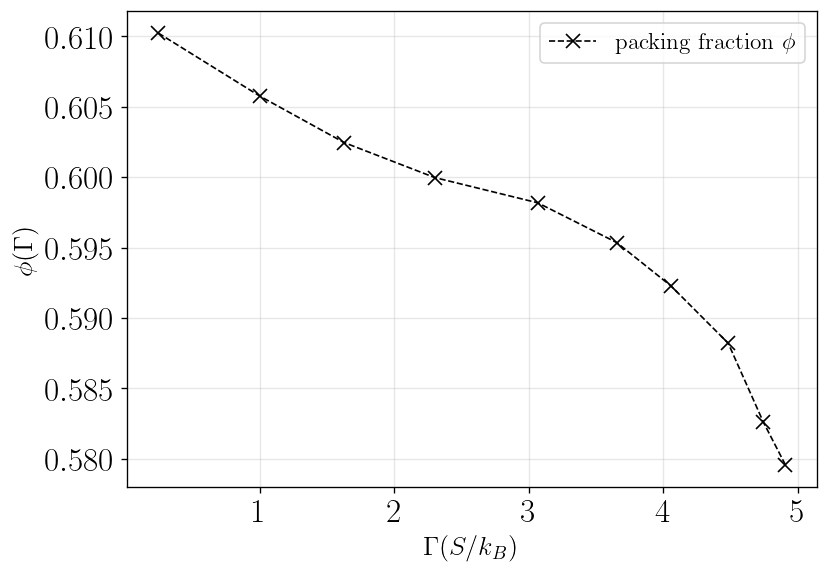

In [304]:
entropy_data = np.loadtxt('data/S.txt')    # columns: [T  Γ]
Ts = entropy_data[:, 0].astype(int)
Gs = entropy_data[:, 1]

a = 1.42   # your length‐scale normalization

Gamma_list    = []
phi_list      = []   # packing‐fraction
five_rings    = []
dislocations  = []
five_coord    = []
seven_coord   = []

for (T, G) in zip(Ts, Gs):
    data = np.loadtxt(f"../output/GAMMAS/{T}/min_{T}K.data", skiprows=15)
    pos = data[:, 2:4]

    φ = packing_fraction(pos)

    n5r, n7r, n_disloc = count_dislocations(pos)

    coords = coordination_numbers(pos)   # use your tuned factor
    n5c = sum(1 for c in coords if c == 5)
    n7c = sum(1 for c in coords if c == 7)

    # 6) Store
    Gamma_list.append(G)
    phi_list.append(φ)
    five_rings.append(n5r)
    dislocations.append(n_disloc)
    five_coord.append(n5c)
    seven_coord.append(n7c)

# 7) Finally, plot φ vs Γ (and any other curves you want)
plt.figure(figsize=(7,5), dpi=120)
plt.plot(Gamma_list, phi_list, 'x--', fillstyle="full", color='k', linewidth=1, markersize=8, label=r"packing fraction $\phi$")
plt.xlabel(r"$\Gamma (S/k_B)$", fontsize=16)
plt.ylabel(r"$\phi(\Gamma)$",       fontsize=16)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.legend(fontsize=14)
plt.savefig("../output/packing_fraction.png", dpi=200)
plt.show()